In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import kagglehub
import os

from skimage.feature import graycomatrix, graycoprops

import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE


from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

import joblib


In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [3]:
!kaggle datasets download -d emmarex/plantdisease
!unzip plantdisease.zip -d plantvillage


Streaming output truncated to the last 5000 lines.
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08c033bd-fbc3-445a-88d1-1863070e52ce___YLCV_GCREC 2872.JPG  
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08dd176c-e9d9-4746-92c3-fa8dc9074347___UF.GRC_YLCV_Lab 03057.JPG  
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08f78a80-46f5-45a6-937c-4d05d61c08c2___UF.GRC_YLCV_Lab 01895.JPG  
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0903aa95-6e8a-4abd-a003-126fcd9a5493___YLCV_GCREC 2806.JPG  
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0911d416-d73d-4c2a-8e45-207a7ceb7c9a___YLCV_GCREC 2773.JPG  
  inflating: plantvillage/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/09188838-cc89-4925-94c5-d9563c4cb4bf___UF.GRC_YLCV_Lab 02974.JPG  
  inflating: plantvillage

In [4]:
dataset_path = "plantvillage/PlantVillage"
classes = sorted(os.listdir(dataset_path))
print("Classes:", classes)

Classes: ['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


In [5]:
for cls in classes:
    cls_path = os.path.join(dataset_path, cls)
    if os.path.isdir(cls_path):
        count = len(os.listdir(cls_path))
        print(f"{cls}: {count} images")


Pepper__bell___Bacterial_spot: 997 images
Pepper__bell___healthy: 1478 images
Potato___Early_blight: 1000 images
Potato___Late_blight: 1000 images
Potato___healthy: 152 images
Tomato_Bacterial_spot: 2127 images
Tomato_Early_blight: 1000 images
Tomato_Late_blight: 1909 images
Tomato_Leaf_Mold: 952 images
Tomato_Septoria_leaf_spot: 1771 images
Tomato_Spider_mites_Two_spotted_spider_mite: 1676 images
Tomato__Target_Spot: 1404 images
Tomato__Tomato_YellowLeaf__Curl_Virus: 3209 images
Tomato__Tomato_mosaic_virus: 373 images
Tomato_healthy: 1591 images



Class: Pepper__bell___Bacterial_spot - Showing 2 of 997 images


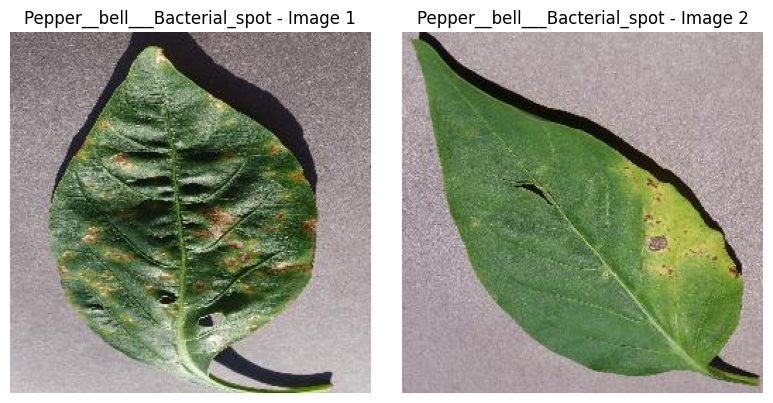


Class: Pepper__bell___healthy - Showing 2 of 1478 images


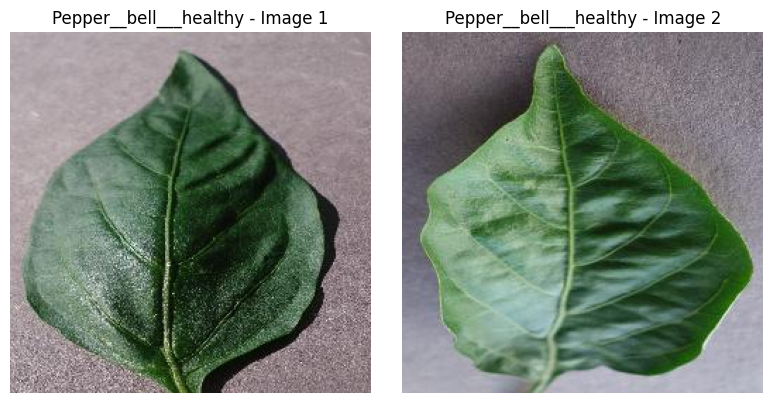


Class: Potato___Early_blight - Showing 2 of 1000 images


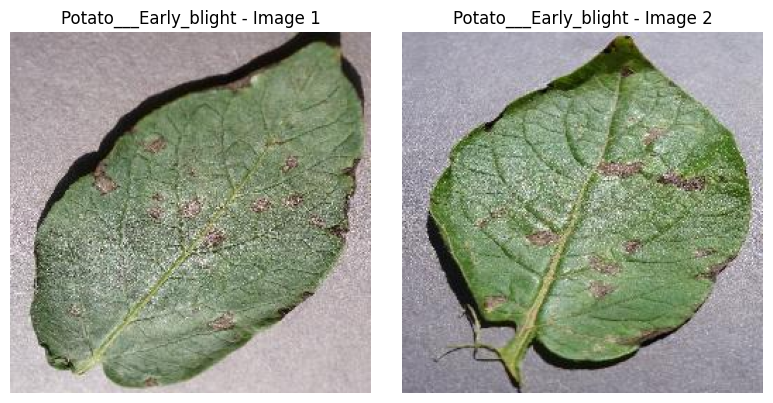


Class: Potato___Late_blight - Showing 2 of 1000 images


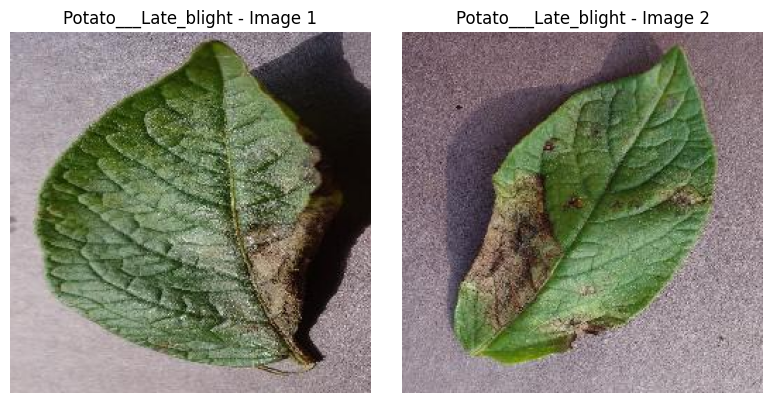


Class: Potato___healthy - Showing 2 of 152 images


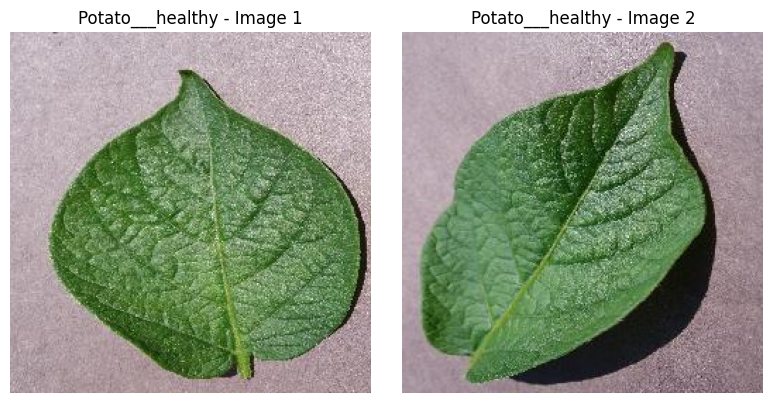


Class: Tomato_Bacterial_spot - Showing 2 of 2127 images


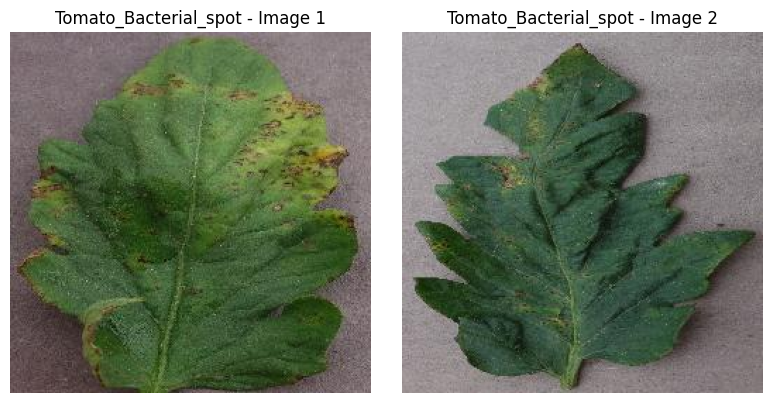


Class: Tomato_Early_blight - Showing 2 of 1000 images


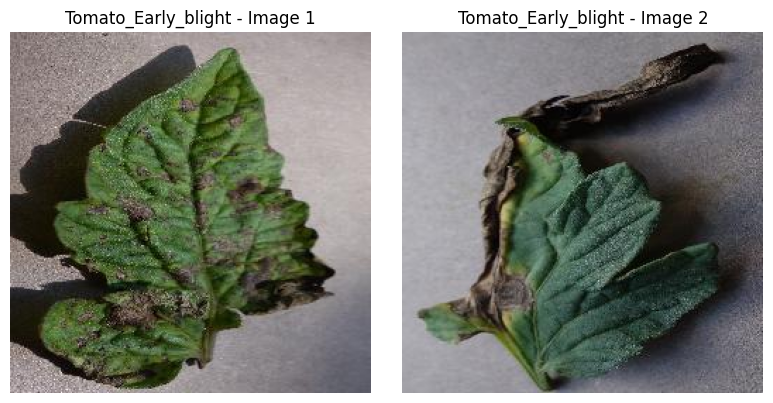


Class: Tomato_Late_blight - Showing 2 of 1909 images


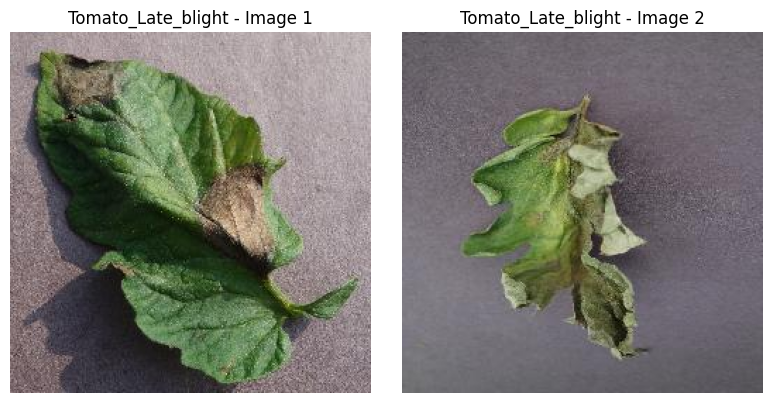


Class: Tomato_Leaf_Mold - Showing 2 of 952 images


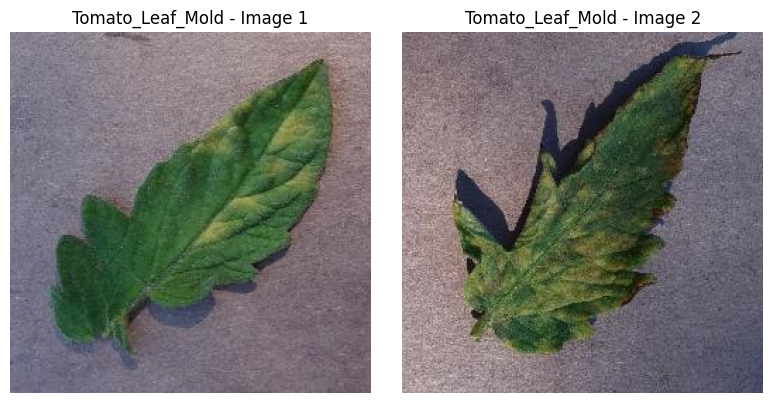


Class: Tomato_Septoria_leaf_spot - Showing 2 of 1771 images


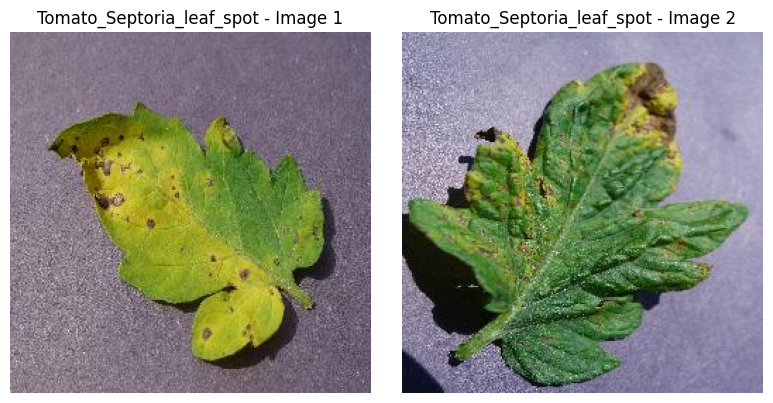


Class: Tomato_Spider_mites_Two_spotted_spider_mite - Showing 2 of 1676 images


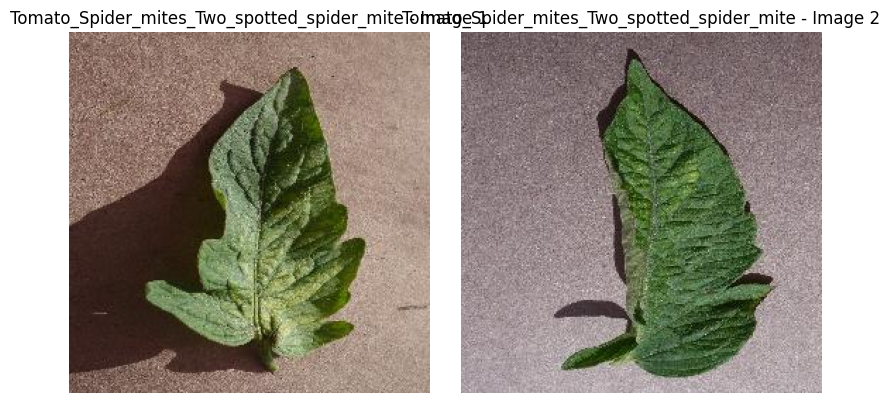


Class: Tomato__Target_Spot - Showing 2 of 1404 images


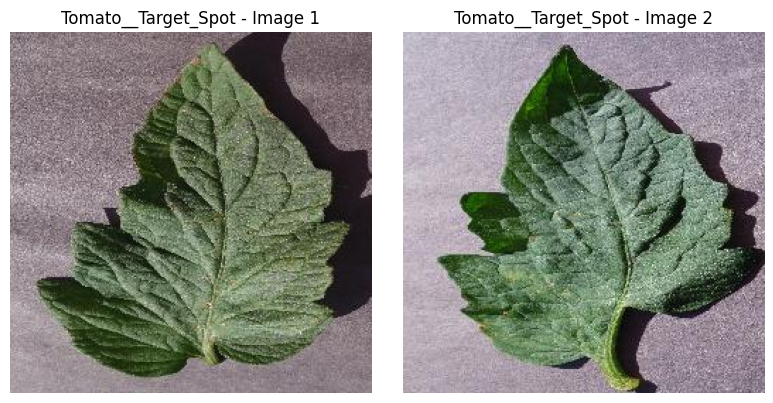


Class: Tomato__Tomato_YellowLeaf__Curl_Virus - Showing 2 of 3208 images


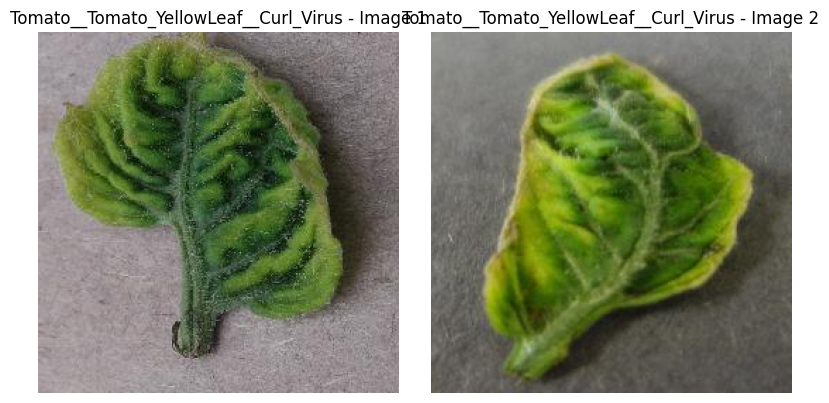


Class: Tomato__Tomato_mosaic_virus - Showing 2 of 373 images


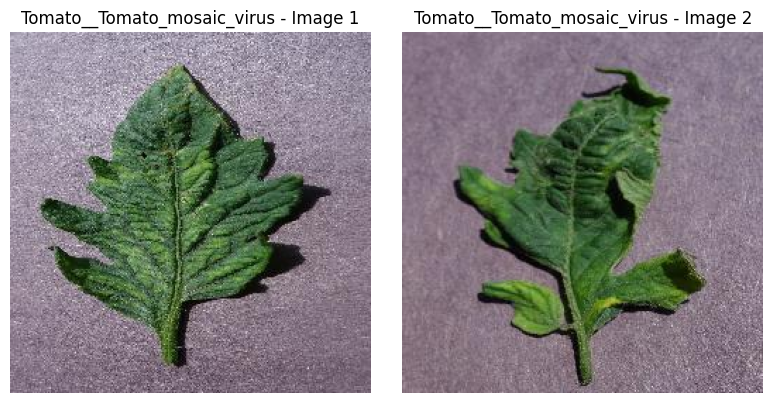


Class: Tomato_healthy - Showing 2 of 1591 images


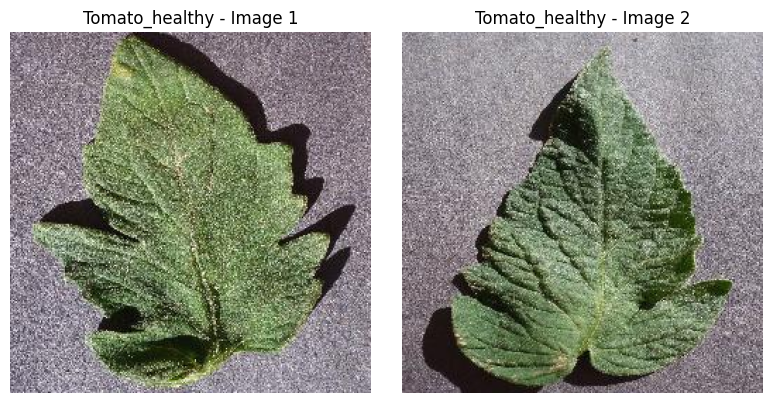

In [7]:
for cls in classes:
    cls_path = os.path.join(dataset_path, cls)
    if os.path.isdir(cls_path):
        images = [img for img in os.listdir(cls_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        print(f"\nClass: {cls} - Showing 2 of {len(images)} images")
        plt.figure(figsize=(8, 4))
        for i in range(2):
            img_path = os.path.join(cls_path, images[i])
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(1, 2, i+1)
            plt.imshow(img)
            plt.title(f"{cls} - Image {i+1}")
            plt.axis('off')
        plt.tight_layout()
        plt.show()

In [8]:
def get_valid_extensions(folder):
    extensions = set()
    for root, dirs, files in os.walk(folder):
        for file in files:
            ext = os.path.splitext(file)[1].lower()
            if ext in ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']:  # Valid image extensions
                extensions.add(ext)
    return extensions

gray_dir = "gray_224"

valid_extensions = get_valid_extensions(gray_dir)

print("Valid extensions found:", valid_extensions)

Valid extensions found: set()


In [9]:
rgb_src_dir = "plantvillage/PlantVillage"
gray_out_dir = "gray_224"
resize_dim = (224, 224)

valid_extensions = ['.jpg', '.jpeg', '.png']

os.makedirs(gray_out_dir, exist_ok = True)

for cls in os.listdir(rgb_src_dir):
    cls_path = os.path.join(rgb_src_dir, cls)

    if not os.path.isdir(cls_path):
        continue

    out_cls_path = os.path.join(gray_out_dir, cls)
    os.makedirs(out_cls_path, exist_ok = True)

    for img_name in os.listdir(cls_path):
        img_path = os.path.join(cls_path, img_name)

        if not any(img_name.lower().endswith(ext) for ext in valid_extensions):
            continue

        try:
            img = cv2.imread(img_path)
            if img is None:
                continue

            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            gray_resized = cv2.resize(gray, resize_dim)

            out_path = os.path.join(out_cls_path, img_name)
            cv2.imwrite(out_path, gray_resized)

        except Exception as e:
            print(f"Error processing {img_path}: {e}")


In [10]:
gray_dir = "gray_224"
props = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']
distances = [1, 2, 3, 4]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
valid_extensions = ['.jpg', '.jpeg', '.png']

features = []
labels = []

for cls in os.listdir(gray_dir):
    cls_path = os.path.join(gray_dir, cls)
    if not os.path.isdir(cls_path):
        continue

    for image_name in os.listdir(cls_path):
        if not any(image_name.lower().endswith(ext) for ext in valid_extensions):
            continue

        image_path = os.path.join(cls_path, image_name)

        try:
            feature_vector = []

            gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if gray is None:
                print(f"!!!Couldn't read image: {image_path}")
                continue

            gray_resized = cv2.resize(gray, (128, 128))
            image_q = np.floor(gray_resized / 2).astype(np.uint8)

            glcm = graycomatrix(
                image_q,
                distances = distances,
                angles = angles,
                levels = 128,
                symmetric = True,
                normed = True
            )

            for p in props:
                prop_vals = graycoprops(glcm, p)
                feature_vector.append(np.mean(prop_vals))
                feature_vector.append(np.std(prop_vals))

            features.append(feature_vector)
            labels.append(cls)

        except Exception as e:
            print(f"!!!Error processing {image_path}: {e}")

columns = []
for p in props:
    columns.append(f"{p}_mean")
    columns.append(f"{p}_std")

df = pd.DataFrame(features, columns = columns)
df['label'] = labels
df.to_csv("glcm_features_only.csv", index = False)
print("GLCM-only features saved to: glcm_features_only.csv")

GLCM-only features saved to: glcm_features_only.csv


In [21]:
df = pd.read_csv("glcm_features_only.csv")

X = df.drop('label', axis = 1).values
y = df['label'].values

le = LabelEncoder()
y_encoded = le.fit_transform(y)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y_encoded)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled,
    y_resampled,
    test_size = 0.2,
    stratify = y_resampled, # balance maintain
    random_state = 42
)


In [23]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report
import joblib
import numpy as np

# Hyperparameter tuning for Random Forest
param_dist_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': ['balanced', 'balanced_subsample', None]
}

rf_random_search = RandomizedSearchCV(
    RandomForestClassifier(random_state = 42),
    param_distributions = param_dist_rf,
    n_iter = 20,
    cv = 3,
    verbose = 2,
    random_state = 42,
    n_jobs = -1
)

print("Training Random Forest...")
rf_random_search.fit(X_train, y_train)

best_rf_model = rf_random_search.best_estimator_
print(f"Best Hyperparameters for Random Forest: {rf_random_search.best_params_}")

# Evaluation
y_pred = best_rf_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {acc:.4f}")
print(classification_report(y_test, y_pred, target_names = le.classes_))

# Cross-validation score
cv_scores = cross_val_score(best_rf_model, X_train, y_train, cv=5)
print(f"Random Forest Cross-Validation Score: {cv_scores.mean():.4f}")

# Save
model_filename = "random_forest_model.joblib"
joblib.dump(best_rf_model, model_filename)
print(f"Random Forest model saved as {model_filename}")


Training Random Forest...
Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Hyperparameters for Random Forest: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30, 'class_weight': None}
Random Forest Accuracy: 0.8420
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.82      0.92      0.87       641
                     Pepper__bell___healthy       0.85      0.77      0.81       642
                      Potato___Early_blight       0.81      0.92      0.86       642
                       Potato___Late_blight       0.83      0.83      0.83       642
                           Potato___healthy       0.89      0.98      0.94       642
                      Tomato_Bacterial_spot       0.76      0.86      0.81       641
                        Tomato_Early_blight       0.83      0.85      0.84       642
                         Tomato_Late_blight       0.87      0.69      0.77       642
                           Tomato_Leaf_Mold       0.85 

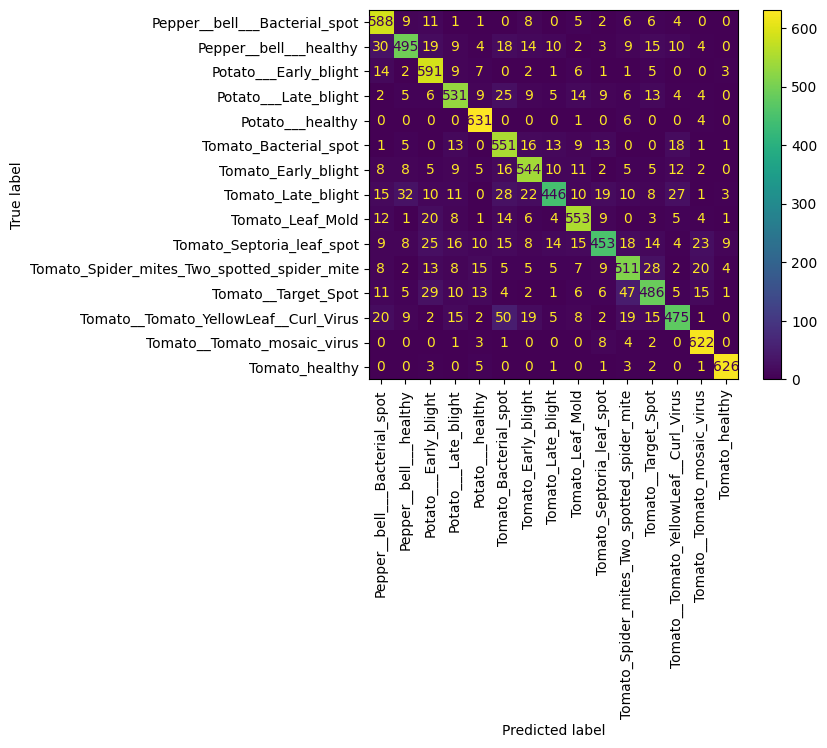

In [25]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(best_rf_model, X_test, y_test, display_labels=le.classes_, xticks_rotation='vertical')


In [31]:
from sklearn.metrics import accuracy_score, classification_report

model_filepath = "random_forest_model.joblib"

rf_model = None

try:
    rf_model = joblib.load(model_filepath)
    print(f"Loaded Random Forest model from {model_filepath}")

except FileNotFoundError:
    print(f"!!! Model file not found for Random Forest: {model_filepath}")

if rf_model:
    y_pred = rf_model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    print(f"Loaded Random Forest model Accuracy: {acc:.4f}")

    print(classification_report(y_test, y_pred, target_names=le.classes_))

else:
    print("Random Forest model could not be loaded. Please check the file path and try again.")


Loaded Random Forest model from random_forest_model.joblib
Loaded Random Forest model Accuracy: 0.8420
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.82      0.92      0.87       641
                     Pepper__bell___healthy       0.85      0.77      0.81       642
                      Potato___Early_blight       0.81      0.92      0.86       642
                       Potato___Late_blight       0.83      0.83      0.83       642
                           Potato___healthy       0.89      0.98      0.94       642
                      Tomato_Bacterial_spot       0.76      0.86      0.81       641
                        Tomato_Early_blight       0.83      0.85      0.84       642
                         Tomato_Late_blight       0.87      0.69      0.77       642
                           Tomato_Leaf_Mold       0.85      0.86      0.86       641
                  Tomato_Septoria_leaf_spot   